In [113]:
import geopandas as gpd
from sqlalchemy import create_engine
from MyCreds.mycreds import Capstone_AWS_SG
from geoalchemy2 import Geometry
from bs4 import BeautifulSoup
import re
from collections import defaultdict

In [118]:
df = gpd.read_file('../data/master-plan-2019-subzone-boundary-no-sea/master-plan-2019-subzone-boundary-no-sea-geojson.geojson')
df

,Name,Description,geometry
0,kml_1,<center><table><tr><th colspan='2' align='cent...,"POLYGON Z ((103.88025 1.28386 0.00000, 103.880..."
1,kml_2,<center><table><tr><th colspan='2' align='cent...,"POLYGON Z ((103.83764 1.29560 0.00000, 103.837..."
2,kml_3,<center><table><tr><th colspan='2' align='cent...,"POLYGON Z ((103.83410 1.29248 0.00000, 103.834..."
3,kml_4,<center><table><tr><th colspan='2' align='cent...,"MULTIPOLYGON Z (((103.71253 1.29163 0.00000, 1..."
4,kml_5,<center><table><tr><th colspan='2' align='cent...,"POLYGON Z ((103.84718 1.29700 0.00000, 103.847..."
...,...,...,...
327,kml_328,<center><table><tr><th colspan='2' align='cent...,"POLYGON Z ((103.84263 1.36323 0.00000, 103.842..."
328,kml_329,<center><table><tr><th colspan='2' align='cent...,"POLYGON Z ((103.83537 1.37093 0.00000, 103.835..."
329,kml_330,<center><table><tr><th colspan='2' align='cent...,"POLYGON Z ((103.84814 1.36879 0.00000, 103.848..."
330,kml_331,<center><table><tr><th colspan='2' align='cent...,"POLYGON Z ((103.84652 1.34521 0.00000, 103.846..."


In [119]:
des = df['Description']

In [120]:
info_dict = defaultdict(dict)

for i, description in enumerate(des):
    soup = BeautifulSoup(des[i])
    table = soup.find_all('tr')[1:]

    info_dict[i] = {re.findall('<th>(\w+)<\/th>\s<td>(.+)?<\/td>', str(row))[0][0]:
                           re.findall('<th>(\w+)<\/th>\s<td>(.+)?<\/td>', str(row))[0][1] for row in table}

zone_info = gpd.GeoDataFrame(info_dict).T

In [121]:
df = df.merge(zone_info, left_index=True, right_index=True)
df = df.reset_index().rename({'index': 'zone_id'}, axis=1).copy()
df.drop('Description', axis=1, inplace=True)
df = df.to_crs(4326)
df

,zone_id,Name,geometry,SUBZONE_NO,SUBZONE_N,SUBZONE_C,CA_IND,PLN_AREA_N,PLN_AREA_C,REGION_N,REGION_C,INC_CRC,FMEL_UPD_D
0,0,kml_1,"POLYGON Z ((103.88025 1.28386 0.00000, 103.880...",1,MARINA EAST,MESZ01,Y,MARINA EAST,ME,CENTRAL REGION,CR,4FB7E5B1B9455DE0,20191223152313
1,1,kml_2,"POLYGON Z ((103.83764 1.29560 0.00000, 103.837...",5,INSTITUTION HILL,RVSZ05,Y,RIVER VALLEY,RV,CENTRAL REGION,CR,C3C22D1EE31757BD,20191223152313
2,2,kml_3,"POLYGON Z ((103.83410 1.29248 0.00000, 103.834...",1,ROBERTSON QUAY,SRSZ01,Y,SINGAPORE RIVER,SR,CENTRAL REGION,CR,87306ABAF4B67E2E,20191223152313
3,3,kml_4,"MULTIPOLYGON Z (((103.71253 1.29163 0.00000, 1...",1,JURONG ISLAND AND BUKOM,WISZ01,N,WESTERN ISLANDS,WI,WEST REGION,WR,C87E378D3456FC35,20191223152313
4,4,kml_5,"POLYGON Z ((103.84718 1.29700 0.00000, 103.847...",2,FORT CANNING,MUSZ02,Y,MUSEUM,MU,CENTRAL REGION,CR,8E8F2616FFA9E019,20191223152313
...,...,...,...,...,...,...,...,...,...,...,...,...,...
327,327,kml_328,"POLYGON Z ((103.84263 1.36323 0.00000, 103.842...",1,UPPER THOMSON,BSSZ01,N,BISHAN,BS,CENTRAL REGION,CR,716DA27F6666AB0C,20191223152313
328,328,kml_329,"POLYGON Z ((103.83537 1.37093 0.00000, 103.835...",5,SHANGRI-LA,AMSZ05,N,ANG MO KIO,AM,NORTH-EAST REGION,NER,9FA8567B39D8D9D7,20191223152313
329,329,kml_330,"POLYGON Z ((103.84814 1.36879 0.00000, 103.848...",4,TOWNSVILLE,AMSZ04,N,ANG MO KIO,AM,NORTH-EAST REGION,NER,F5558D84EBC2AAA7,20191223152313
330,330,kml_331,"POLYGON Z ((103.84652 1.34521 0.00000, 103.846...",2,MARYMOUNT,BSSZ02,N,BISHAN,BS,CENTRAL REGION,CR,154AA8659ADDE6D7,20191223152313


In [123]:
engine = create_engine(f'postgresql+psycopg2://{Capstone_AWS_SG.username}:{Capstone_AWS_SG.password}@{Capstone_AWS_SG.host}/Capstone', echo=False)


with engine.connect() as cnxn:
    df.to_postgis('master_plan_2019_subzone_boundary', cnxn, if_exists='replace', index=False, dtype={'geometry': Geometry(geometry_type='POLYGON', srid=4326)})

# Testing mapping to ensure geometry correct

In [111]:
# sg_map_data = pd.DataFrame({0: {'latitude': 1.3521, 'longitude': 103.8198}}).T
# sg_map_data = gpd.GeoDataFrame(
#     sg_map_data, geometry=gpd.points_from_xy(sg_map_data['longitude'], sg_map_data['latitude']))

import plotly.express as px
import plotly.graph_objects as go
from MyCreds.mycreds import MapBox
import shapely.geometry


# fig = go.Figure(
#     go.Scattermapbox(
#         df,
#         mode='lines', fill='toself',
#         lon=df['geometry'].x,
#         lat=df['geometry'].y,
#     )
# )
#
# fig.update_layout(
#     mapbox={'style': 'light', 'center': {'lat': 1.3521, 'lon': 103.8198}, 'zoom': 10}
# )
#
# fig.show()

px.set_mapbox_access_token(MapBox.token)




sg_base_map = px.choropleth_mapbox(df,
                                # lat=df['geometry'].y,
                                # lon=df['geometry'].x,
                                # locations=df['geometry'],
                                geojson=df['geometry'].__geo_interface__,
                                locations='id',
                                center={'lat': 1.3521, 'lon': 103.8198},
                                zoom=10,
                                # width=500,
                                height=600,
                                opacity=0.1,
                                mapbox_style='light',
                                hover_data=['Name', 'SUBZONE_N']
                                # symbol='park'
                                # # marker = {'size': 20, 'symbol': ["airport"]}
                                )

In [112]:
sg_base_map.show()

In [77]:
geos = gpd.GeoSeries(df['geometry']).__geo_interface__

In [78]:
print(geos)

{'type': 'FeatureCollection', 'features': [{'id': '0', 'type': 'Feature', 'properties': {}, 'geometry': {'type': 'Polygon', 'coordinates': (((103.880249116798, 1.28385858286793, 0.0), (103.880244925073, 1.28385637720003, 0.0), (103.880240277788, 1.28385411275685, 0.0), (103.880235950388, 1.28385216754845, 0.0), (103.880230725344, 1.2838500206833, 0.0), (103.880225781549, 1.28384818401003, 0.0), (103.88022116932, 1.28384663582293, 0.0), (103.880215790636, 1.28384502434443, 0.0), (103.880212303389, 1.28384408929577, 0.0), (103.880205939908, 1.28384259721156, 0.0), (103.880201003317, 1.28384162691941, 0.0), (103.880195627342, 1.28384075340235, 0.0), (103.880190791394, 1.28384012676685, 0.0), (103.880186169301, 1.28383966833923, 0.0), (103.880181961437, 1.28383936907214, 0.0), (103.880176705878, 1.28383915212153, 0.0), (103.880171510525, 1.28383910880782, 0.0), (103.880165986309, 1.2838392481818, 0.0), (103.880160029901, 1.28383961365489, 0.0), (103.88015525687, 1.28384006863824, 0.0), (10

In [79]:
df['geometry'].__geo_interface__

{'type': 'FeatureCollection',
 'features': [{'id': '0',
   'type': 'Feature',
   'properties': {},
   'geometry': {'type': 'Polygon',
    'coordinates': (((103.880249116798, 1.28385858286793, 0.0),
      (103.880244925073, 1.28385637720003, 0.0),
      (103.880240277788, 1.28385411275685, 0.0),
      (103.880235950388, 1.28385216754845, 0.0),
      (103.880230725344, 1.2838500206833, 0.0),
      (103.880225781549, 1.28384818401003, 0.0),
      (103.88022116932, 1.28384663582293, 0.0),
      (103.880215790636, 1.28384502434443, 0.0),
      (103.880212303389, 1.28384408929577, 0.0),
      (103.880205939908, 1.28384259721156, 0.0),
      (103.880201003317, 1.28384162691941, 0.0),
      (103.880195627342, 1.28384075340235, 0.0),
      (103.880190791394, 1.28384012676685, 0.0),
      (103.880186169301, 1.28383966833923, 0.0),
      (103.880181961437, 1.28383936907214, 0.0),
      (103.880176705878, 1.28383915212153, 0.0),
      (103.880171510525, 1.28383910880782, 0.0),
      (103.880165986

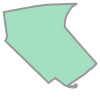

In [80]:
df['geometry'][0]

In [81]:
df['geometry']

0      POLYGON Z ((103.88025 1.28386 0.00000, 103.880...
1      POLYGON Z ((103.83764 1.29560 0.00000, 103.837...
2      POLYGON Z ((103.83410 1.29248 0.00000, 103.834...
3      MULTIPOLYGON Z (((103.71253 1.29163 0.00000, 1...
4      POLYGON Z ((103.84718 1.29700 0.00000, 103.847...
                             ...                        
327    POLYGON Z ((103.84263 1.36323 0.00000, 103.842...
328    POLYGON Z ((103.83537 1.37093 0.00000, 103.835...
329    POLYGON Z ((103.84814 1.36879 0.00000, 103.848...
330    POLYGON Z ((103.84652 1.34521 0.00000, 103.846...
331    MULTIPOLYGON Z (((103.62602 1.30692 0.00000, 1...
Name: geometry, Length: 332, dtype: geometry

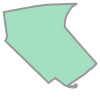

In [82]:
df['geometry'].values[0]

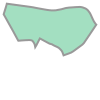

In [83]:
df['geometry'].values[1]

In [84]:
print(df['geometry'].values[1])

POLYGON Z ((103.837644579895 1.29559851582294 0, 103.837662185056 1.29559792885996 0, 103.837673288358 1.29559835117921 0, 103.837965938591 1.29560948519755 0, 103.838250858742 1.29566494844789 0, 103.83839606252 1.29569018807812 0, 103.838528547415 1.29571383513979 0, 103.838990067491 1.29584070567815 0, 103.839087295332 1.29585793270339 0, 103.839353333491 1.29589227895299 0, 103.839558043315 1.29590692283473 0, 103.839708812661 1.29591753427424 0, 103.83986700847 1.295927319096 0, 103.840002224024 1.29593593191198 0, 103.84021531636 1.29594763020176 0, 103.840306509562 1.29595289064095 0, 103.840423095606 1.29595815462291 0, 103.840511488018 1.29595275621875 0, 103.840584539579 1.29594153826808 0, 103.840648482602 1.29593003727558 0, 103.840715165269 1.29591314445033 0, 103.840777504368 1.29589402508999 0, 103.840820285777 1.29587811447275 0, 103.840861227869 1.29586288575136 0, 103.840930391384 1.29583695649968 0, 103.841001934238 1.29580985337332 0, 103.84105754231 1.2957798527089

In [87]:
df.reset_index().rename({'index': 'id'}, axis=1, inplace=True)

,id,Name,Description,geometry,SUBZONE_NO,SUBZONE_N,SUBZONE_C,CA_IND,PLN_AREA_N,PLN_AREA_C,REGION_N,REGION_C,INC_CRC,FMEL_UPD_D
0,0,kml_1,<center><table><tr><th colspan='2' align='cent...,"POLYGON Z ((103.88025 1.28386 0.00000, 103.880...",1,MARINA EAST,MESZ01,Y,MARINA EAST,ME,CENTRAL REGION,CR,4FB7E5B1B9455DE0,20191223152313
1,1,kml_2,<center><table><tr><th colspan='2' align='cent...,"POLYGON Z ((103.83764 1.29560 0.00000, 103.837...",5,INSTITUTION HILL,RVSZ05,Y,RIVER VALLEY,RV,CENTRAL REGION,CR,C3C22D1EE31757BD,20191223152313
2,2,kml_3,<center><table><tr><th colspan='2' align='cent...,"POLYGON Z ((103.83410 1.29248 0.00000, 103.834...",1,ROBERTSON QUAY,SRSZ01,Y,SINGAPORE RIVER,SR,CENTRAL REGION,CR,87306ABAF4B67E2E,20191223152313
3,3,kml_4,<center><table><tr><th colspan='2' align='cent...,"MULTIPOLYGON Z (((103.71253 1.29163 0.00000, 1...",1,JURONG ISLAND AND BUKOM,WISZ01,N,WESTERN ISLANDS,WI,WEST REGION,WR,C87E378D3456FC35,20191223152313
4,4,kml_5,<center><table><tr><th colspan='2' align='cent...,"POLYGON Z ((103.84718 1.29700 0.00000, 103.847...",2,FORT CANNING,MUSZ02,Y,MUSEUM,MU,CENTRAL REGION,CR,8E8F2616FFA9E019,20191223152313
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
327,327,kml_328,<center><table><tr><th colspan='2' align='cent...,"POLYGON Z ((103.84263 1.36323 0.00000, 103.842...",1,UPPER THOMSON,BSSZ01,N,BISHAN,BS,CENTRAL REGION,CR,716DA27F6666AB0C,20191223152313
328,328,kml_329,<center><table><tr><th colspan='2' align='cent...,"POLYGON Z ((103.83537 1.37093 0.00000, 103.835...",5,SHANGRI-LA,AMSZ05,N,ANG MO KIO,AM,NORTH-EAST REGION,NER,9FA8567B39D8D9D7,20191223152313
329,329,kml_330,<center><table><tr><th colspan='2' align='cent...,"POLYGON Z ((103.84814 1.36879 0.00000, 103.848...",4,TOWNSVILLE,AMSZ04,N,ANG MO KIO,AM,NORTH-EAST REGION,NER,F5558D84EBC2AAA7,20191223152313
330,330,kml_331,<center><table><tr><th colspan='2' align='cent...,"POLYGON Z ((103.84652 1.34521 0.00000, 103.846...",2,MARYMOUNT,BSSZ02,N,BISHAN,BS,CENTRAL REGION,CR,154AA8659ADDE6D7,20191223152313


In [ ]:

# To select points from resale_location_features that fall within the boundries of the master plan zones
sql = """select mp.* , lf.transaction_id, lf.geometry
from master_plan_2019_subzone_boundary as mp
join resale_location_features as lf
on ST_WITHIN(lf.geometry, mp.geometry)
where extract(year from lf.month) = 2020;"""